In [11]:
# import the libraries
import numpy as np
import pandas as pd
import re
from textblob import TextBlob

In [12]:
# basic dependencies
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')
import seaborn as sns

import re
from tqdm import tqdm
import string

In [13]:
# import the data
df_path = "../content/drive/MyDrive/Berleley-Final-Project/Bitcoin_tweets.csv"
df = pd.read_csv(df_path)

df.head(10)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (5,7,8,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,DeSota Wilson,"Atlanta, GA","Biz Consultant, real estate, fintech, startups...",39929.836910,8534,7605,4838.0,FALSE,44237.9993518519,Blue Ridge Bank shares halted by NYSE after #b...,['bitcoin'],Twitter Web App,False
1,CryptoND,NaN,😎 BITCOINLIVE is a Dutch platform aimed at inf...,43755.841782,6769,1532,25483.0,FALSE,44237.9991666667,"😎 Today, that's this #Thursday, we will do a ""...","['Thursday', 'Btc', 'wallet', 'security']",Twitter for Android,False
2,Tdlmatias,"London, England","IM Academy : The best #forex, #SelfEducation, ...",41953.451817,128,332,924.0,FALSE,44237.9963888889,"Guys evening, I have read this article about B...",NaN,Twitter Web App,False
3,Crypto is the future,NaN,I will post a lot of buying signals for BTC tr...,43736.700139,625,129,14.0,FALSE,44237.9962152778,$BTC A big chance in a billion! Price: \487264...,"['Bitcoin', 'FX', 'BTC', 'crypto']",dlvr.it,False
4,Alex Kirchmaier 🇦🇹🇸🇪 #FactsSuperspreader,Europa,Co-founder @RENJERJerky | Forbes 30Under30 | I...,42403.552720,1249,1472,10482.0,FALSE,44237.9959027778,This network is secured by 9 508 nodes as of t...,['BTC'],Twitter Web App,False
5,ZerrBenz™ ⚔ ✪ 20732,"Bkk, Thailand",I'm a cat slave 🐱 Interested in Blockchain · T...,40190.291713,742,716,2444.0,FALSE,44237.9954861111,💹 Trade #Crypto on #Binance \n\n📌 Enjoy #Cashb...,"['Crypto', 'Binance', 'Cashback']",Twitter Web App,False
6,Bitcoin-Bot,"Florida, USA",Bot to generate Bitcoin picture as combination...,43822.700880,131,84,5728.0,FALSE,44237.9953356481,&lt;'fire' &amp; 'man'&gt;\n#Bitcoin #Crypto #...,"['Bitcoin', 'Crypto', 'BTC']",BTC_p_bot,False
7,Cryptocurrencies / EUR,NaN,Stay updated on the main cryptocurrencies of t...,43315.895926,4052,1,9.0,FALSE,44237.9949305556,🔄 Prices update in $EUR (1 hour):\n\n$BTC - ...,NaN,Cryptocurrencies prices to EUR,False
8,Mikcoin,NaN,"Technical Analyst | Trader\n\nNo certainty, on...",44161.990116,104,41,238.0,FALSE,44237.9947337963,#BTC #Bitcoin #Ethereum #ETH #Crypto #cryptotr...,"['BTC', 'Bitcoin', 'Ethereum', 'ETH', 'Crypto'...",Twitter Web App,False
9,DeSota Wilson,"Atlanta, GA","Biz Consultant, real estate, fintech, startups...",39929.836910,8534,7605,4838.0,FALSE,44237.994537037,.@Tesla’s #bitcoin investment is revolutionary...,"['bitcoin', 'crypto']",Twitter Web App,False


# EDA
###target classification
###value analysis
  * split => number of total-words, per-word length
  * corpus (both target0 and target1)
  * punctuations
  * some common words

In [17]:
# remove nan value row in hastags column
df. dropna(subset = ["hashtags"], inplace=True)
df.head(5)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,DeSota Wilson,"Atlanta, GA","Biz Consultant, real estate, fintech, startups...",39929.836910,8534,7605,4838.0,FALSE,44237.9993518519,Blue Ridge Bank shares halted by NYSE after #b...,['bitcoin'],Twitter Web App,False
1,CryptoND,NaN,😎 BITCOINLIVE is a Dutch platform aimed at inf...,43755.841782,6769,1532,25483.0,FALSE,44237.9991666667,"😎 Today, that's this #Thursday, we will do a ""...","['Thursday', 'Btc', 'wallet', 'security']",Twitter for Android,False
3,Crypto is the future,NaN,I will post a lot of buying signals for BTC tr...,43736.700139,625,129,14.0,FALSE,44237.9962152778,$BTC A big chance in a billion! Price: \487264...,"['Bitcoin', 'FX', 'BTC', 'crypto']",dlvr.it,False
4,Alex Kirchmaier 🇦🇹🇸🇪 #FactsSuperspreader,Europa,Co-founder @RENJERJerky | Forbes 30Under30 | I...,42403.552720,1249,1472,10482.0,FALSE,44237.9959027778,This network is secured by 9 508 nodes as of t...,['BTC'],Twitter Web App,False
5,ZerrBenz™ ⚔ ✪ 20732,"Bkk, Thailand",I'm a cat slave 🐱 Interested in Blockchain · T...,40190.291713,742,716,2444.0,FALSE,44237.9954861111,💹 Trade #Crypto on #Binance \n\n📌 Enjoy #Cashb...,"['Crypto', 'Binance', 'Cashback']",Twitter Web App,False


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1031781 entries, 0 to 1048574
Data columns (total 13 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   user_name         1031769 non-null  object 
 1   user_location     552540 non-null   object 
 2   user_description  916708 non-null   object 
 3   user_created      1031781 non-null  float64
 4   user_followers    1031781 non-null  int64  
 5   user_friends      1031781 non-null  object 
 6   user_favourites   1031781 non-null  float64
 7   user_verified     1031781 non-null  object 
 8   date              1031781 non-null  object 
 9   text              1031781 non-null  object 
 10  hashtags          1031781 non-null  object 
 11  source            1029534 non-null  object 
 12  is_retweet        1031776 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 110.2+ MB


In [19]:
df.shape

(1031781, 13)

In [20]:
#Checking the columns
df.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [21]:
# check data
def show_info(data, is_matrix_transpose=False):
    # basic shape
    print('data shape is: {}   sample number {}   attribute number {}\n'.format(data.shape, data.shape[0], data.shape[1]))
    # attribute(key)
    print('data columns number {}  \nall columns: {}\n'.format(len(data.columns) ,data.columns))
    # value's null
    print('data all attribute count null:\n', data.isna().sum())
    # data value analysis and data demo
    if is_matrix_transpose:
        print('data value analysis: ', data.describe().T)
        print('data demo without matrix transpose: ', data.head().T)
    else:
        print('data value analysis: ', data.describe())
        print('data demo without matrix transpose: ', data.head())
    print('\n' * 5)
        
show_info(df)


data shape is: (1031781, 13)   sample number 1031781   attribute number 13

data columns number 13  
all columns: Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

data all attribute count null:
 user_name               12
user_location       479241
user_description    115073
user_created             0
user_followers           0
user_friends             0
user_favourites          0
user_verified            0
date                     0
text                     0
hashtags                 0
source                2247
is_retweet               5
dtype: int64
data value analysis:         user_created  user_followers  user_favourites
count  1.031781e+06    1.031781e+06     1.031781e+06
mean   4.304706e+04    9.213987e+03     7.249971e+03
std    1.443218e+03    1.164793e+05     2.308956e+04
min    8.100000e+01    

In [22]:

import os
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
import re
from nltk.stem.porter import *
plt.style.use('seaborn')
import plotly.express as px
from plotly import graph_objs as go
from collections import Counter
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from plotly.subplots import make_subplots
import plotly.graph_objects as go

pd.reset_option('^display.', silent=True)

# Load half the data and separate target from predictors
df2 = pd.read_csv('../content/drive/MyDrive/Berleley-Final-Project/Bitcoin_tweets.csv', nrows=300000, encoding='latin1')


# Convert text to string type
df2['text'] = df2['text'].astype(str)

print("Total number of samples:", len(df))

df2.head()

Total number of samples: 1031781


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (5,7,8,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,DeSota Wilson,"Atlanta, GA","Biz Consultant, real estate, fintech, startups...",39929.836910,8534,7605,4838.0,FALSE,44237.9993518519,Blue Ridge Bank shares halted by NYSE after #b...,['bitcoin'],Twitter Web App,False
1,CryptoND,NaN,ð BITCOINLIVE is a Dutch platform aimed at ...,43755.841782,6769,1532,25483.0,FALSE,44237.9991666667,"ð Today, that's this #Thursday, we will do ...","['Thursday', 'Btc', 'wallet', 'security']",Twitter for Android,False
2,Tdlmatias,"London, England","IM Academy : The best #forex, #SelfEducation, ...",41953.451817,128,332,924.0,FALSE,44237.9963888889,"Guys evening, I have read this article about B...",NaN,Twitter Web App,False
3,Crypto is the future,NaN,I will post a lot of buying signals for BTC tr...,43736.700139,625,129,14.0,FALSE,44237.9962152778,$BTC A big chance in a billion! Price: \487264...,"['Bitcoin', 'FX', 'BTC', 'crypto']",dlvr.it,False
4,Alex Kirchmaier ð¦ð¹ð¸ðª #FactsSupersp...,Europa,Co-founder @RENJERJerky | Forbes 30Under30 | I...,42403.552720,1249,1472,10482.0,FALSE,44237.9959027778,This network is secured by 9 508 nodes as of t...,['BTC'],Twitter Web App,False


In [23]:
# Print a random tweet as a sample
sample_index = 25
print(df.iloc[sample_index])

user_name                                               DeSota Wilson
user_location                                             Atlanta, GA
user_description    Biz Consultant, real estate, fintech, startups...
user_created                                              39929.83691
user_followers                                                   8534
user_friends                                                     7605
user_favourites                                                4838.0
user_verified                                                   FALSE
date                                                 44237.9865277778
text                The @Grayscale #Bitcoin Trust: What it is and ...
hashtags               ['Bitcoin', 'digital', 'asset', 'fund', 'BTC']
source                                                Twitter Web App
is_retweet                                                      False
Name: 31, dtype: object


#Text preprocessing
Next step is to do some early preprocesing of the tweets to make them easier to work with and reduce overhead. Initial data cleaning requirements that are common for tweets:

###Remove Twitter handles as they give no relevant info.
###Remove punctuations, numbers and special characters
###Remove smaller words since they usually don't add value (< 2 characters)
###Reduce words to their root word (stemming), for example transform "loves", "loving", "loveable" to "love".

Once the initial cleaning is done, we can split every tweet into individual words or tokens which is an essential step in any NLP task.

In [26]:
# Helper function to remove unwanted patterns
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt

# Remove Twitter handles from the data 
df2['text'] = np.vectorize(remove_pattern)(df2['text'], "@[\w]*")

# Remove punctuations, numbers, and special characters
df2['text'] = df2['text'].str.replace("[^a-zA-Z#]", " ")

# Remove all words below 3 characters
df2['text'] = df2['text'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))

# Tokenize the tweets
tokenized_tweet = df2['text'].apply(lambda x: x.split())

# Stem the tweets
stemmer = PorterStemmer()
tokenized_tweet = tokenized_tweet.apply(lambda x: [stemmer.stem(i) for i in x])

# Put the processed tweets back in the dataframe
for i in range(len(tokenized_tweet)):
    tokenized_tweet[i] = ' '.join(tokenized_tweet[i])
df['text'] = tokenized_tweet

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: The default value of regex will change from True to False in a future version.
  if sys.path[0] == '':


In [27]:
tweet_len = df2['text'].str.split().map(lambda x: len(x))

fig = go.Figure()
fig.add_trace(go.Histogram(x=tweet_len, histfunc='avg', name="Average Word Length", opacity=0.75, histnorm='probability density'))

fig.update_layout(
    title_text='Number of words in tweets', # title of plot
    xaxis_title_text='Value', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2,
    bargroupgap=0.1,
)
fig.show()

In [28]:
fig = px.scatter(df2,
                 x="user_followers",
                 y="is_retweet",
                 color="user_followers",
                 labels={col:col.replace('_', ' ') for col in df.columns},
                 log_x=True
                 )

fig.update_layout(
    title='User Followers vs Retweet Count',
)

fig.show()

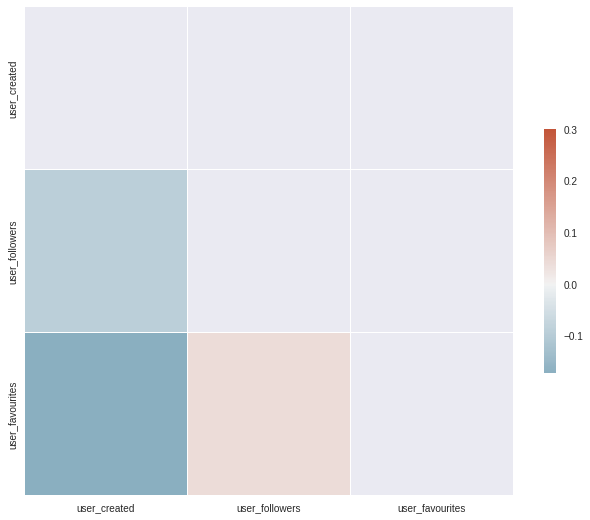

In [29]:
# Compute the correlation matrix
corr = df2.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [32]:
fig = px.scatter_matrix(df2,
    dimensions=["user_location",
                "user_description",
                "user_followers",
                "user_friends",
                "is_retweet"],
                labels={col:col.replace('_', ' ') for col in df2.columns}, # remove underscore
                color = "user_followers"
                )

fig.update_layout(
    title='Scatter matrix of numerical variables',
    dragmode='select',
    width=800,
    height=800,
    hovermode='closest'
)

fig.show()

In [31]:
fig = px.scatter(df2,
                 x="user_followers",
                 y="user_friends",
                 color="user_followers",
                 labels={col:col.replace('_', ' ') for col in df2.columns},
                 log_x=True,
                 log_y=True
                 )

fig.update_layout(
    title='Followers Count vs User Freinds',
)

fig.show()

In [34]:
import re
from wordcloud import WordCloud, STOPWORDS

In [35]:
df2['text']. value_counts(). idxmax()

'BTCUSD Current Bitcoin Price Day High Day Low Year Low Year High Day Moving Avg Day Moving Avg #Bitcoin #RealMoney #BTC #Cypto'

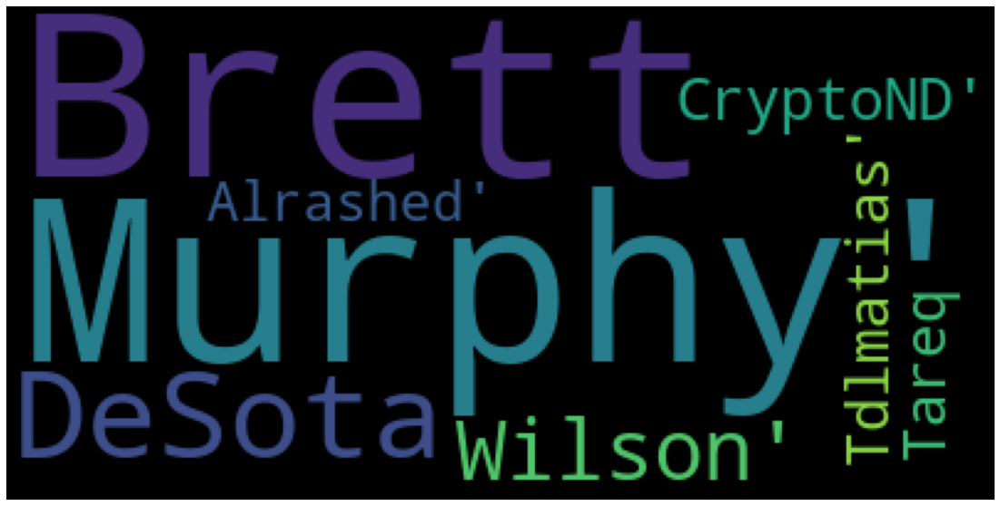

In [36]:
text = df2['user_name'].values 

# Create a WordCloud object
wordcloud = WordCloud(background_color="black", max_words=5000, contour_width=3, 
contour_color='steelblue')# Generate a word cloud
wordcloud = WordCloud().generate(str(text))
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

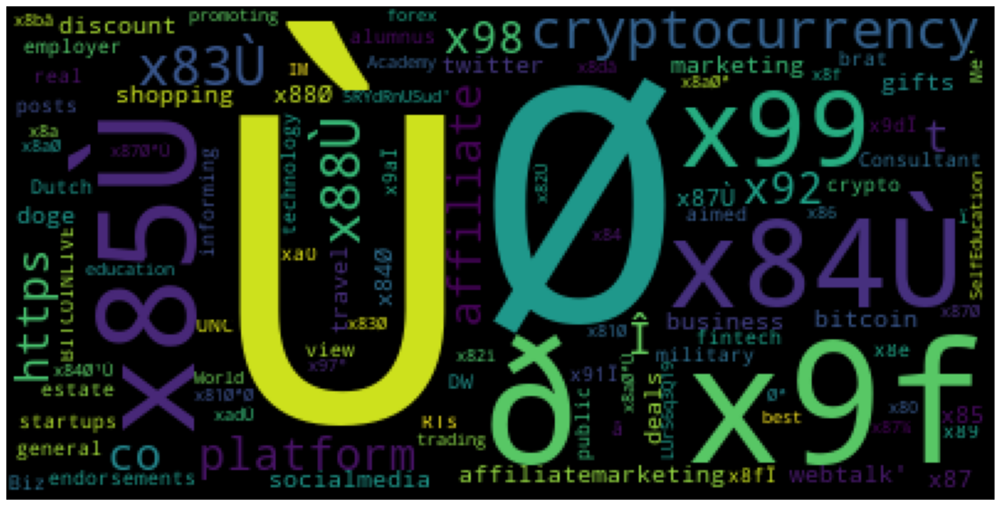

In [37]:
text = df2['user_description'].values 

# Create a WordCloud object
wordcloud = WordCloud(background_color="black", max_words=5000, contour_width=3, 
contour_color='steelblue')# Generate a word cloud
wordcloud = WordCloud().generate(str(text))
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

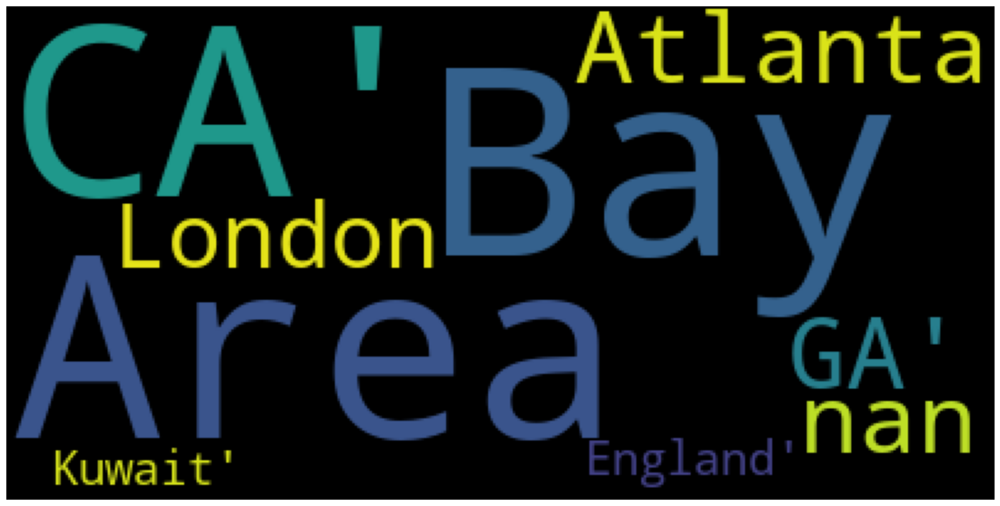

In [38]:
text = df2['user_location'].values 

# Create a WordCloud object
wordcloud = WordCloud(background_color="black", max_words=5000, contour_width=3, 
contour_color='steelblue')# Generate a word cloud
wordcloud = WordCloud().generate(str(text))
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


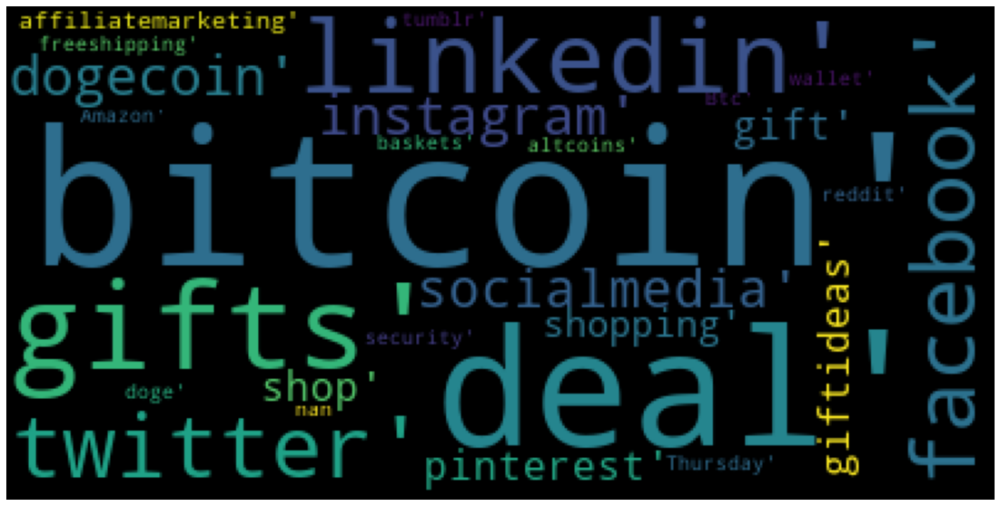

In [39]:
text = df2['hashtags'].values 

# Create a WordCloud object
wordcloud = WordCloud(background_color="black", max_words=5000, contour_width=3, 
contour_color='steelblue')# Generate a word cloud
wordcloud = WordCloud().generate(str(text))
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


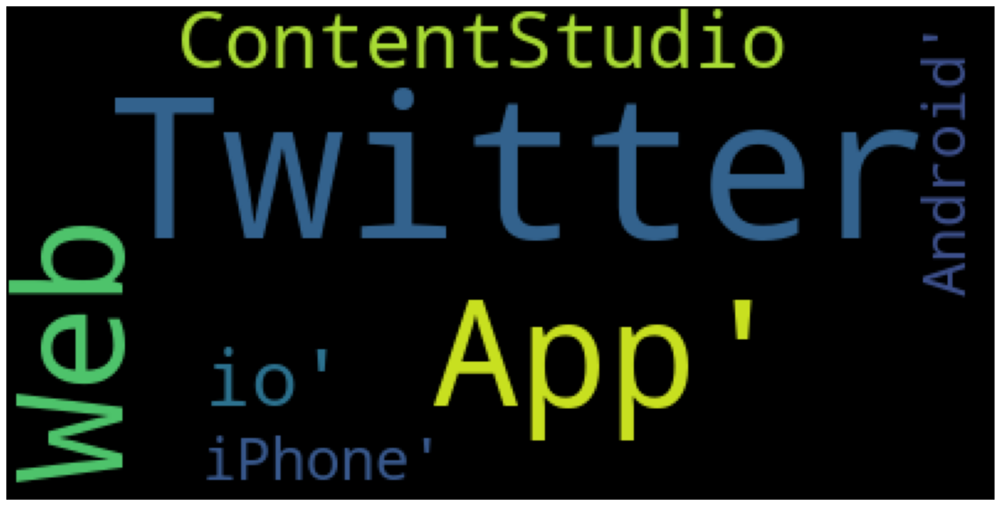

In [40]:
text = df2['source'].values 

# Create a WordCloud object
wordcloud = WordCloud(background_color="black", max_words=5000, contour_width=3, 
contour_color='steelblue')# Generate a word cloud
wordcloud = WordCloud().generate(str(text))
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

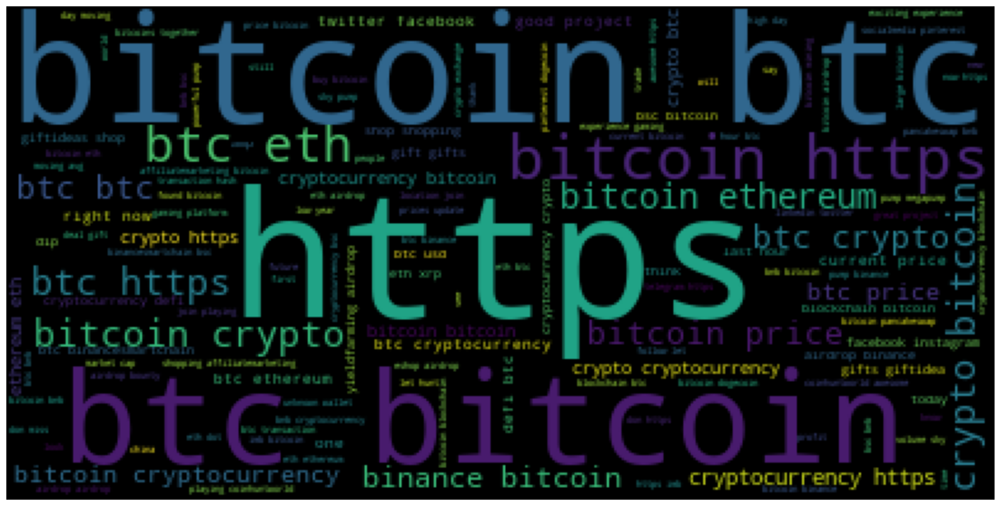

In [41]:
# Remove punctuation
df2['text_proc'] = \
df2['text'].map(lambda x: re.sub('[,\.!?]', '', x))

# Convert the titles to lowercase
df2['text_proc'] = \
df2['text_proc'].map(lambda x: x.lower())

# Print out the first rows of papers
df2['text_proc'].head()


# Join the different processed titles together.
long_string = ','.join(list(df2['text_proc'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="black", max_words=5000, contour_width=3, 
contour_color='steelblue')# Generate a word cloud
wordcloud.generate(long_string)# Visualize the word cloud
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [43]:
from collections import Counter
data = Counter(" ".join(df2["text"]).split()).most_common(25)
data

[('https', 232976),
 ('#Bitcoin', 171773),
 ('the', 134616),
 ('#bitcoin', 95762),
 ('#BTC', 78401),
 ('and', 75295),
 ('for', 50278),
 ('BTC', 46488),
 ('#btc', 42540),
 ('#cryptocurrency', 41993),
 ('you', 40189),
 ('#crypto', 37749),
 ('this', 35817),
 ('Bitcoin', 29068),
 ('will', 26815),
 ('#Crypto', 26527),
 ('The', 24953),
 ('with', 23956),
 ('project', 22349),
 ('that', 21870),
 ('are', 21542),
 ('Price', 18534),
 ('price', 18215),
 ('your', 17358),
 ('#ETH', 16696)]